# Automating pollen viability assessment through object detection

An object detection model was trained utilizing the [tensorflow object detection api](https://github.com/tensorflow/models/tree/master/research/object_detection) with Faster-RCNN, to detect and classify germinated and ungerimated pollen grains. The model was trained on pollen grains imaged from various cycads and manually labeled with [labelImg](https://github.com/tzutalin/labelImg)


### Imports

In [1]:
# Loading Libraries
import os
import tensorflow.compat.v1 as tf # specify compatibility
from PIL import Image
import image_slicer
import cv2
from IPython.display import Image as Img
from IPython.display import display
# Loading functions
from utils.viz_utils import *
from utils.inference_utils import *

### Loading object detection model

In [4]:
# Loading trained object detection model

# path to current working directory
cwd_path = os.getcwd()

# Path to frozen detection graph .pb file, which contains the model that is used for object detection.
model_path = os.path.join(cwd_path,'model','frozen_inference_graph.pb')

# Load model
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(model_path, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

## Processing input images

Full Resolution: (4912, 3684)


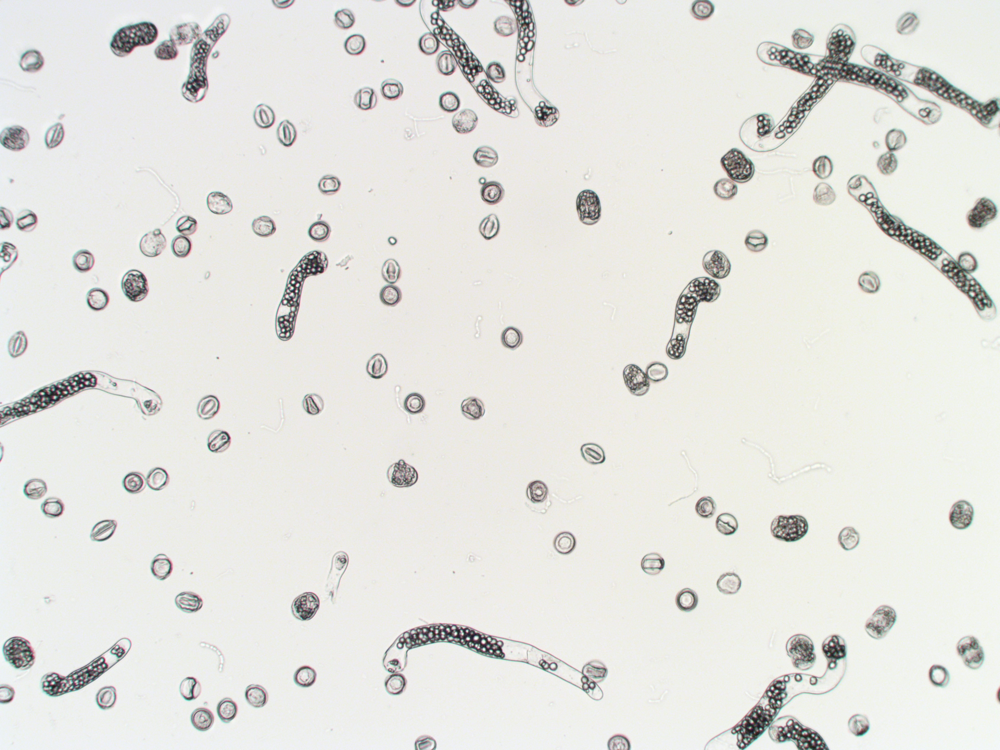

In [12]:
# Full resoultion image
image_paths = get_image_paths('test_images')
img = image_paths[0]
image = Image.open(img)
print("Full Resolution:",image.size)
Img(img,width = 500)

### Reducing resolution by 1/8

Reduced Resolution: (614, 460)


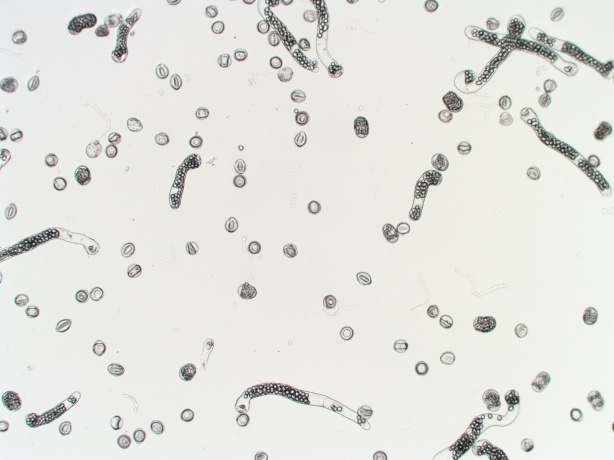

In [13]:
# Reducing resolution by 1/8
img_name = img.split('\\')[1].split('.')[0]
image = cv2.imread(img)
resized = cv2.resize(image,None,fx=0.125, fy=0.125, interpolation=cv2.INTER_AREA) #1/8 = 0.125
img_outpath = f'processed_images/resized/{img_name}_resized.jpg'
cv2.imwrite(img_outpath,resized)

image = Image.open(img_outpath)
print("Reduced Resolution:",image.size)
Img(img_outpath,width = 500)

### Dividing input image

The division into four sub images increases the training data available to model as well as greatly increases the speed of the manual labeling step. As germinated grains are longer and more apt to span the split divisions a bias may exist towards germinated grains in viability computations. This bias can be reduced by taking two images along the diagonal in each set for computations.

Split image: (307, 230)


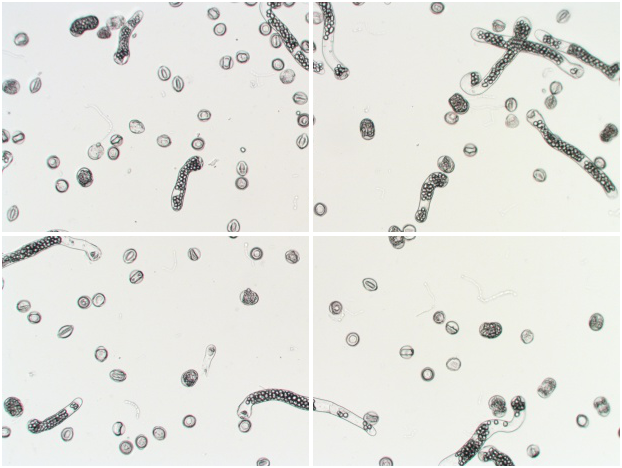

In [14]:
#Splitting input image into four sub images

split_dir = 'processed_images/split'
tiles = image_slicer.slice(img_outpath, 4, save = False)
image_slicer.save_tiles(tiles, directory=split_dir,prefix=img_name)
image_names = os.listdir(split_dir)
image_paths = [os.path.join(split_dir, i) for i in image_names  if i.split('_')[0] == img_name]

image = Image.open(image_paths[0])
print("Split image:",image.size)
join_image(img_name,image_paths)

## Detecting viable pollen grains

In [20]:
#Runninig object detection model on input images
result_df = []
image_paths = get_image_paths(split_dir)
for img in image_paths:
    image = Image.open(img)
    image_np = load_image_into_numpy_array(image)
    image_np_expanded = np.expand_dims(image_np, axis=0)
    output_dict = run_inference_for_single_image(image_np_expanded, detection_graph) # run object dection model
    df = outputdict_to_df(output_dict = output_dict,image_path = img,score_threshold = 0.5)
    viability = compute_viability(df,img) # compute percent viability by image
    result_df.append(viability)
    bbox_plot(df,img,scale_factor=1,save = True, display = False) # saving boundry box plots to images
result_df = pd.DataFrame(result_df)

### Visualizing predicted boundry boxes and germination status

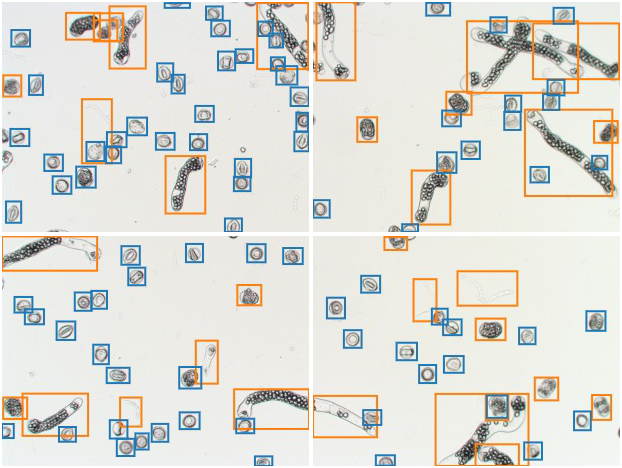

,germinated_count,ungerminated_count,total_count,percent_viability,parent_image,image_path
0,8,31,39,20.512821,195,processed_images/split\195_01_01.png
1,8,14,22,36.363636,195,processed_images/split\195_01_02.png
2,7,22,29,24.137931,195,processed_images/split\195_02_01.png
3,10,15,25,40.000000,195,processed_images/split\195_02_02.png


In [53]:
# model output grouped boundry box images
img_paths = get_image_paths('results')
plt_imgs  = group_split_image_paths(img_paths)[img_name] # just plot_images
display(join_image(img_name,plt_imgs))
result_df[result_df['parent_image'] == img_name]

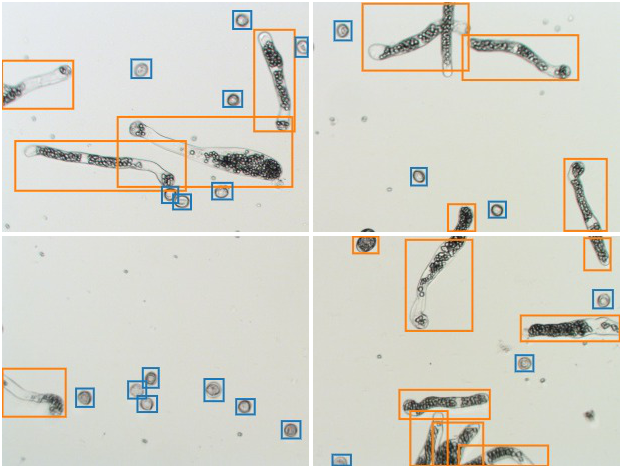

,germinated_count,ungerminated_count,total_count,percent_viability,parent_image,image_path
4,4,7,11,36.363636,251,processed_images/split\251_01_01.png
5,4,3,7,57.142857,251,processed_images/split\251_01_02.png
6,1,7,8,12.500000,251,processed_images/split\251_02_01.png
7,8,3,11,72.727273,251,processed_images/split\251_02_02.png


In [54]:
img_name  = '251'
img_paths = get_image_paths('results')
plt_imgs  = group_split_image_paths(img_paths) 
display(join_image(img_name,plt_imgs[img_name]))
result_df[result_df['parent_image'] == img_name]

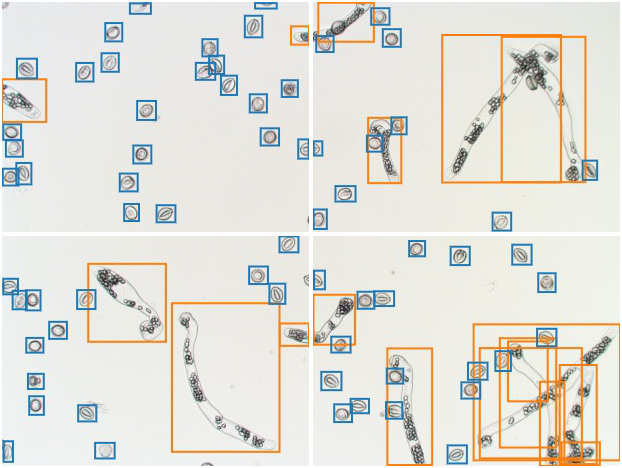

,germinated_count,ungerminated_count,total_count,percent_viability,parent_image,image_path
8,2,24,26,7.692308,38,processed_images/split\38_01_01.png
9,4,10,14,28.571429,38,processed_images/split\38_01_02.png
10,3,14,17,17.647059,38,processed_images/split\38_02_01.png
11,9,18,27,33.333333,38,processed_images/split\38_02_02.png


In [69]:
img_name = '38'
display(join_image(img_name,plt_imgs[img_name]))
result_df[result_df['parent_image'] == img_name]